# Anagramas

Na construção de uma carreira sólida como programador, é fundamental desenvolver a habilidade de resolver problemas de forma clara, estruturada e eficiente. Exercícios simples, como a detecção de anagramas, ajudam a consolidar conceitos essenciais como manipulação de strings, uso de estruturas de dados e lógica de programação.

Considere o seguinte problema: dadas duas strings `s1` e `s2`, determine se uma é um anagrama da outra. Ou seja, ambas devem conter exatamente os mesmos caracteres, com as mesmas frequências, independentemente da ordem.


In [1]:
def anagram(s1, s2):
    def count_chars(s):
        h = {}
        for char in s:
            if char in h:
                h[char] += 1
            else:
                h[char] = 1
        return h

    return count_chars(s1) == count_chars(s2)

A função `count_chars` percorre cada caractere da string e monta um dicionário com a contagem de ocorrências. Ao comparar os dois dicionários, verificamos se as strings são anagramas.

A função `show_anagram_result` abaixo imprime se uma string é anagrama da outra de forma legível.


In [2]:
def show_anagram_result(s1, s2):
    result = anagram(s1, s2)
    if result:
        print(f'"{s2}" é anagrama de "{s1}".')
    else:
        print(f'"{s2}" não é anagrama de "{s1}".')

In [3]:
# Casos que devem retornar True
show_anagram_result("listen", "silent")
show_anagram_result("binary", "brainy")
show_anagram_result("aabbcc", "baccab")
show_anagram_result("abc", "cab")
show_anagram_result("aaa", "aaa")
show_anagram_result("hello", "holle")
show_anagram_result("banana", "abaann")

"silent" é anagrama de "listen".
"brainy" é anagrama de "binary".
"baccab" é anagrama de "aabbcc".
"cab" é anagrama de "abc".
"aaa" é anagrama de "aaa".
"holle" é anagrama de "hello".
"abaann" é anagrama de "banana".


In [4]:
# Casos que devem retornar False
show_anagram_result("test", "ttew")
show_anagram_result("abc", "abcd")
show_anagram_result("python", "nothpyy")
show_anagram_result("abc", "acd")
show_anagram_result("abc", "def")

"ttew" não é anagrama de "test".
"abcd" não é anagrama de "abc".
"nothpyy" não é anagrama de "python".
"acd" não é anagrama de "abc".
"def" não é anagrama de "abc".


# Referências

1. Cormen, T. H., Leiserson, C. E., Rivest, R. L., & Stein, C. (2009). *Introduction to Algorithms* (3rd ed.). MIT Press.  
2. Sedgewick, R., & Wayne, K. (2011). *Algorithms* (4th ed.). Addison-Wesley.  
3. Skiena, S. S. (2008). *The Algorithm Design Manual* (2nd ed.). Springer.  
4. https://leetcode.com/problems/valid-anagram/  
5. https://www.hackerrank.com/  
6. https://www.geeksforgeeks.org/check-whether-two-strings-are-anagram-of-each-other/  

C:\Users\osval\anaconda3\envs\Oz\lib\site-packages\matplotlib\animation.py:887: UserWarning: Animation was deleted without rendering anything. This is most likely not intended. To prevent deletion, assign the Animation to a variable, e.g. `anim`, that exists until you have outputted the Animation using `plt.show()` or `anim.save()`.
  warnings.warn(


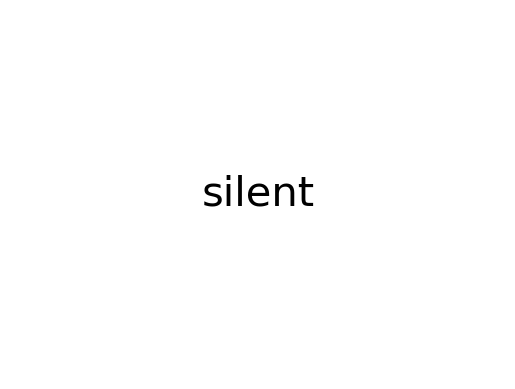

In [6]:
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML

s1 = "listen"
s2 = "silent"

fig, ax = plt.subplots()
ax.axis('off')
text = ax.text(0.5, 0.5, "", fontsize=30, ha='center', va='center')

frames = [s1]
for i in range(len(s2)):
    intermediate = list(s1)
    intermediate[i], intermediate[s2.index(s1[i])] = intermediate[s2.index(s1[i])], intermediate[i]
    frames.append("".join(intermediate))
frames.append(s2)

def update(frame):
    text.set_text(frame)
    return text,

ani = animation.FuncAnimation(fig, update, frames=frames, interval=500, repeat=False)

HTML(ani.to_jshtml())


In [55]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML

# Parâmetros
r = 1
R = 3 * r
n_frames = 360
theta = np.linspace(0, 2*np.pi, n_frames)

fig, ax = plt.subplots(figsize=(6, 6))
ax.set_aspect('equal')
ax.set_xlim(-5*r, 5*r)
ax.set_ylim(-5*r, 5*r)
ax.axis('off')

# Círculo maior (fixo)
big_circle = plt.Circle((0, 0), R, color='black', fill=False, linewidth=2)
ax.add_patch(big_circle)

# Círculo azul estático no ponto de contato inicial
initial_contact = plt.Circle((R, 0), 0.07, color='blue')
ax.add_patch(initial_contact)

# Círculo menor (móvel) e marcador vermelho
small_circle = plt.Circle((0, 0), r, color='black', fill=False, linewidth=2)
marker, = ax.plot([], [], 'ro', markersize=5)
ax.add_patch(small_circle)

# Texto com contador
counter_text = ax.text(-4.5*r, 4.5*r, '', fontsize=14, color='darkred', weight='bold')

# Função de atualização
def update(frame):
    t = theta[frame]
    x = (R + r) * np.cos(t)
    y = (R + r) * np.sin(t)
    phi = (R + r + r) * t / r  # anti-horário

    # Posição do marcador vermelho
    small_circle.center = (x, y)
    marker.set_data(x + r * np.cos(phi + np.pi), y + r * np.sin(phi + np.pi))

    # Contador de voltas completas
    n_rot = int(phi // (2 * np.pi))
    counter_text.set_text(f"Voltas completas: {n_rot}")

    return small_circle, marker, counter_text

# Criar animação
ani = animation.FuncAnimation(fig, update, frames=n_frames, blit=True, interval=40)

plt.close(fig)
HTML(ani.to_jshtml())
